# Image Denoising with Anisotropic Diffusion
## Also comparitive study with FFT based and gaussian blur based denoising

### Required Libraries

In [221]:
import numpy as np
import cv2
import warnings
import math
from matplotlib import pyplot as plt
from PIL import Image
from io import BytesIO

### Image import and histogram

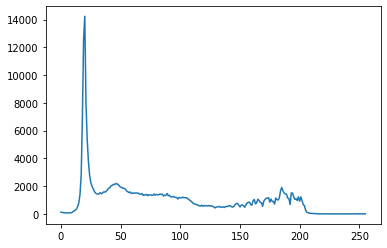

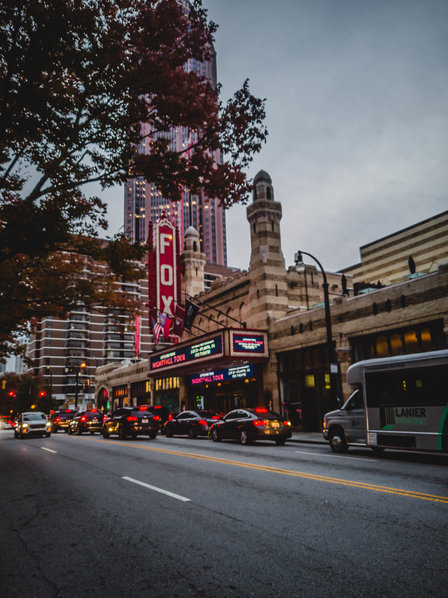

In [222]:
x = "./test images/test6.jpg"
imagehist = cv2.imread(x)
# find frequency of pixels in range 0-255 
histr = cv2.calcHist([imagehist],[0],None,[256],[0,256]) 
  
# show the plotting graph of an image 
plt.plot(histr) 
plt.show() 

image = Image.open(x)
image

### Image to black-and-white with normalization

In [223]:
def convert(original):
    original = np.array(image.convert('L'))
    original_min, original_max = original.min(), original.max()
    orig = (original - original_min) / (float)(original_max - original_min)
    return orig

In [224]:
def display(im):
    return Image.fromarray(np.uint8(im*255))

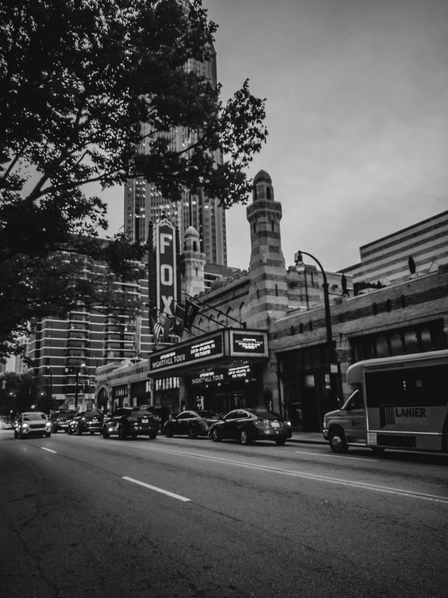

In [225]:
orig = convert(image)
display(orig)

### Stop functions:

In [226]:
def f1(dt,b):
    return np.exp(-1* (np.power(dt,2))/(np.power(b,2)))

In [227]:
def f2(dt,b): 
    func = 1/(1 + ((dt/b)**2))
    return func

### Anisotropic Diffusion function:

In [228]:
def anisodiff(im, steps, b, l = 0.25): 
    temp = np.zeros(im.shape, dtype=im.dtype) 
    for t in range(steps): 
        dn = im[:-2,1:-1] - im[1:-1,1:-1] 
        ds = im[2:,1:-1] - im[1:-1,1:-1] 
        de = im[1:-1,2:] - im[1:-1,1:-1] 
        dw = im[1:-1,:-2] - im[1:-1,1:-1] 
        temp[1:-1,1:-1] = im[1:-1,1:-1] +\
                            l * (f1(dn,b)*dn + f1(ds,b)*ds + 
                                    f1(de,b)*de + f1(dw,b)*dw) 
        im = temp 
    return im

### Noise - Gaussian, Salt and Pepper, Poisson and Speckle :

In [229]:
def noisy(noise_typ,image):
    if noise_typ == "gauss":
        row,col = image.shape
        mean = 0
        var = 0.01
        sigma = var**0.5
        gauss = np.random.normal(mean,sigma,(row,col))
        gauss = gauss.reshape(row,col)
        noisy = image + gauss
        return noisy
    elif noise_typ == "sp":
        row,col = image.shape
        s_vs_p = 0.5
        amount = 0.004
        out = np.copy(image)
        num_salt = np.ceil(amount * image.size * s_vs_p)
        coords = [np.random.randint(0, i - 1, int(num_salt))
                for i in image.shape]
        out[coords] = 1
        num_pepper = np.ceil(amount* image.size * (1. - s_vs_p))
        coords = [np.random.randint(0, i - 1, int(num_pepper))
                for i in image.shape]
        out[coords] = 0
        return out
    elif noise_typ == "poisson":
        vals = len(np.unique(image))
        vals = 2 ** np.ceil(np.log2(vals))
        noisy = np.random.poisson(image * vals) / float(vals)
        return noisy
    elif noise_typ =="speckle":
        row,col = image.shape
        gauss = np.random.randn(row,col)
        gauss = gauss.reshape(row,col)        
        noisy = image + image * gauss
        return noisy

### Add noise to Image

In [230]:
noise_g = noisy("gauss", orig)
noise_p = noisy("poisson", orig)
noise_sp = noisy("sp", orig)
noise_speckle = noisy("speckle", orig)

C:\Users\pavan\Anaconda3\lib\site-packages\ipykernel_launcher.py:19: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
C:\Users\pavan\Anaconda3\lib\site-packages\ipykernel_launcher.py:23: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.


### Anisotropic Diffusion based Denoising

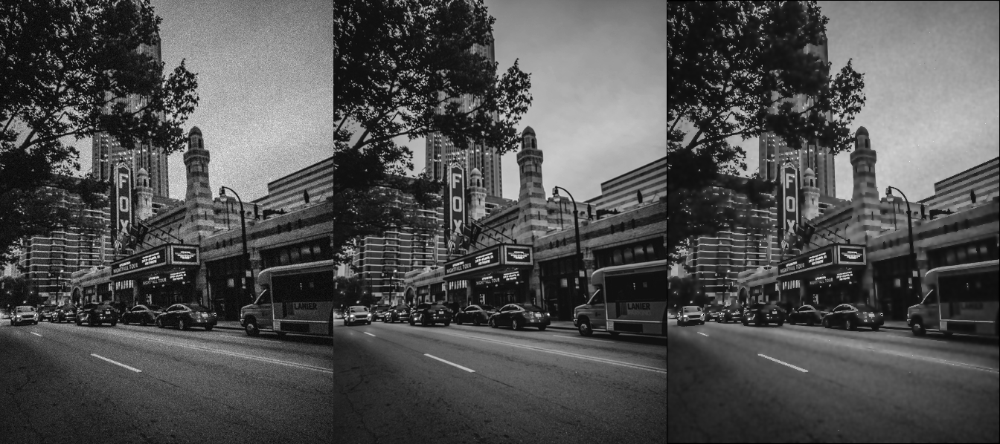

In [231]:
denoised_p = anisodiff(noise_p, 10, 0.1, 0.15)
result_p = Image.fromarray(np.hstack((np.uint8(noise_p*255),np.uint8(orig*255), np.uint8(denoised_p*255))))
result_p

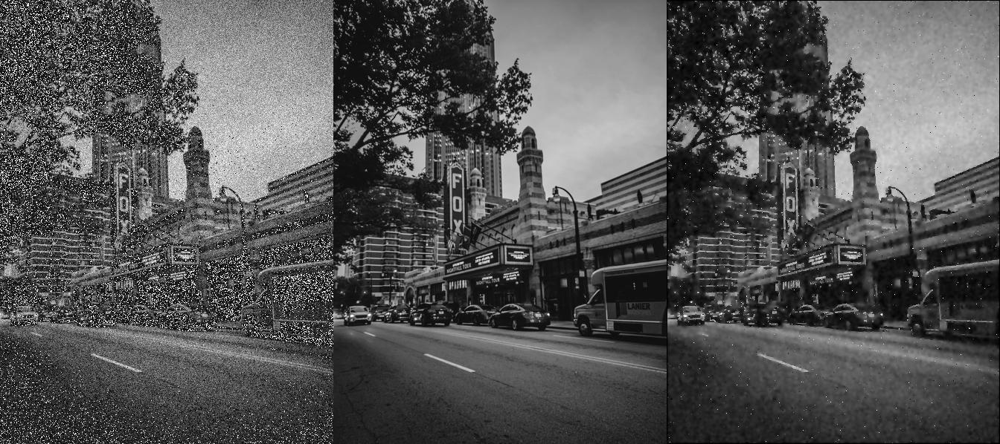

In [232]:
denoised_g = anisodiff(noise_g, 13, 0.15, 0.15)
result_g = Image.fromarray(np.hstack((np.uint8(noise_g*255),np.uint8(orig*255), np.uint8(denoised_g*255))))
result_g

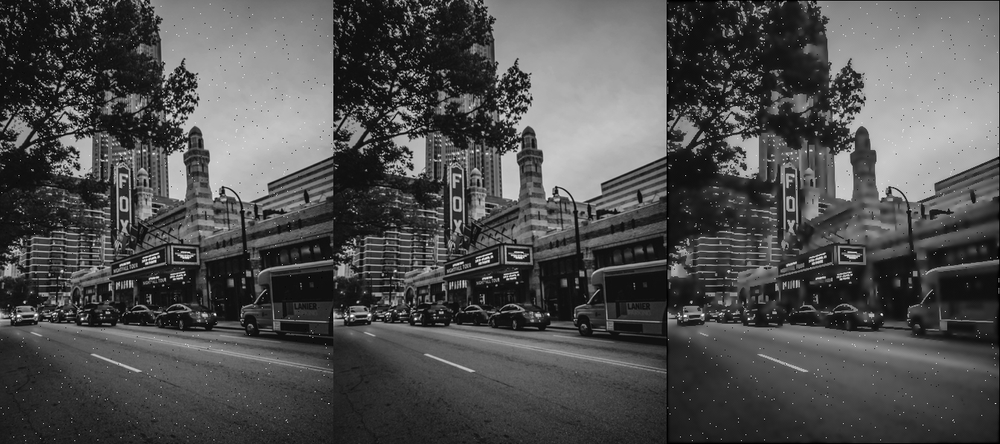

In [233]:
denoised_sp = anisodiff(noise_sp, 15, 0.10, 0.33)
result_sp = Image.fromarray(np.hstack((np.uint8(noise_sp*255),np.uint8(orig*255), np.uint8(denoised_sp*255))))
result_sp

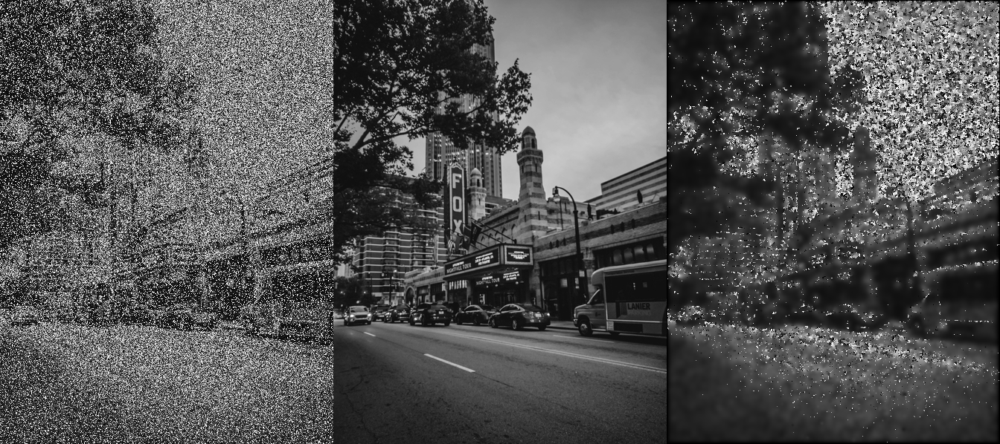

In [234]:
denoised_speckle = anisodiff(noise_speckle, 40, 0.25, 0.2)
result_spe = Image.fromarray(np.hstack((np.uint8(noise_speckle*255),np.uint8(orig*255), np.uint8(denoised_speckle*255))))
result_spe

### Anisotropic Diffusion Denoising Output - All Noises

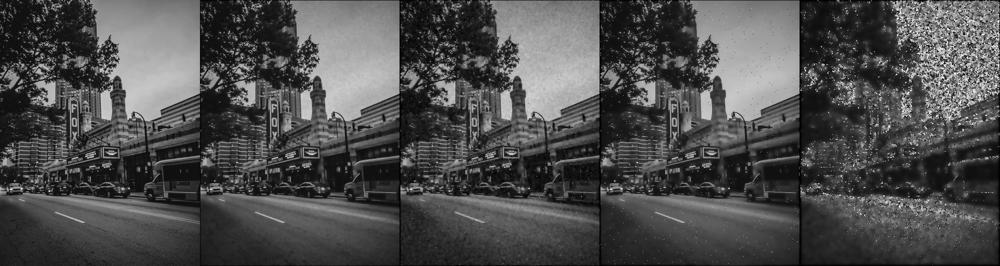

In [235]:
Image.fromarray(np.hstack((np.uint8(orig*255),np.uint8(denoised_p*255),np.uint8(denoised_g*255), np.uint8(denoised_sp*255), np.uint8(denoised_speckle*255))))

## Other Denoising methods

### Fast Fourier Transform

In [236]:
def denoise_fft(im, keep_fraction):
    F = np.fft.fft2(im)
    ff = F.copy()
    r,c = ff.shape
    ff[int(r*keep_fraction):int(r*(1-keep_fraction))] = 0
    ff[:,int(c*keep_fraction):int(c*(1-keep_fraction))] = 0
    im_new = np.fft.ifft2(ff).real
    return im_new

In [237]:
fftp = denoise_fft(noise_p, 0.2)
fftg = denoise_fft(noise_g, 0.2)
fftsp = denoise_fft(noise_sp, 0.2)
fftspeckle = denoise_fft(noise_speckle, 0.2)

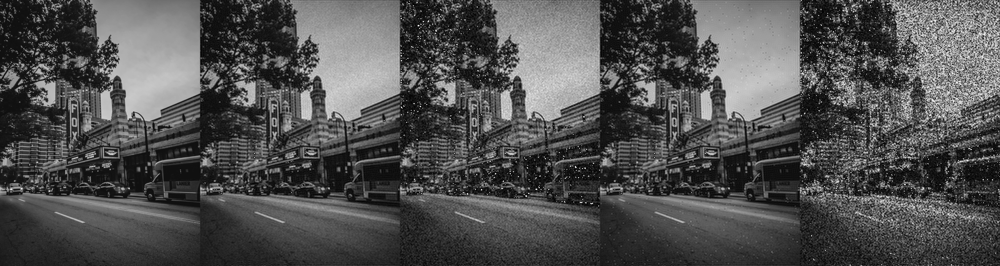

In [238]:
Image.fromarray(np.hstack((np.uint8(orig*255),np.uint8(fftp*255),np.uint8(fftg*255), np.uint8(fftsp*255), np.uint8(fftspeckle*255))))

### Gaussian Blur

In [239]:
def gblur(a):
    kernel = np.array([[1.0,2.0,1.0], [2.0,4.0,2.0], [1.0,2.0,1.0]])
    kernel = kernel / np.sum(kernel)
    arraylist = []
    for y in range(3):
        temparray = np.copy(a)
        temparray = np.roll(temparray, y - 1, axis=0)
        for x in range(3):
            temparray_X = np.copy(temparray)
            temparray_X = np.roll(temparray_X, x - 1, axis=1)*kernel[y,x]
            arraylist.append(temparray_X)

    arraylist = np.array(arraylist)
    arraylist_sum = np.sum(arraylist, axis=0)
    return arraylist_sum

In [240]:
gbp = gblur(noise_p)
gbg = gblur(noise_g)
gbsp = gblur(noise_sp)
gbspeckle = gblur(noise_speckle)

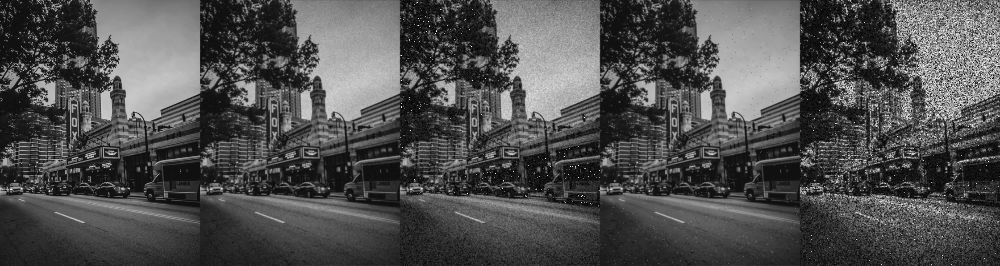

In [241]:
Image.fromarray(np.hstack((np.uint8(orig*255),np.uint8(gbp*255),np.uint8(gbg*255), np.uint8(gbsp*255), np.uint8(gbspeckle*255))))

### Comparison between Anisotropic Diffusion, FFT and Gaussian (Metrics - PSNR and MSE)

In [242]:
def psnr(img1, img2):
    mse = np.mean( (img1 - img2) ** 2 )
    if mse == 0:
        return 100
    pix_max = 255.0
    return 20 * math.log10(pix_max / math.sqrt(mse))

# the higher the PSNR, the better 

In [243]:
def mse(img1, img2):
    squared_diff = (img1 -img2) ** 2
    summed = np.sum(squared_diff)
    num_pix = img1.shape[0] * img1.shape[1] #img1 and 2 should have same shape
    err = summed / num_pix
    return err

#the smaller the error, the better

PSNR for poisson noise denoised with anisotorpic diffusion:  76.08666989710096
PSNR for poisson noise denoised with gaussian blur:  76.40710211710542
PSNR for poisson noise denoised with FFT:  73.7686443515376
MSE for poisson noise denoised with anisotorpic diffusion:  0.0016010812483640724
MSE for poisson noise denoised with gaussian blur:  0.0014872026449902563
MSE for poisson noise denoised with FFT:  0.0027303349333382037


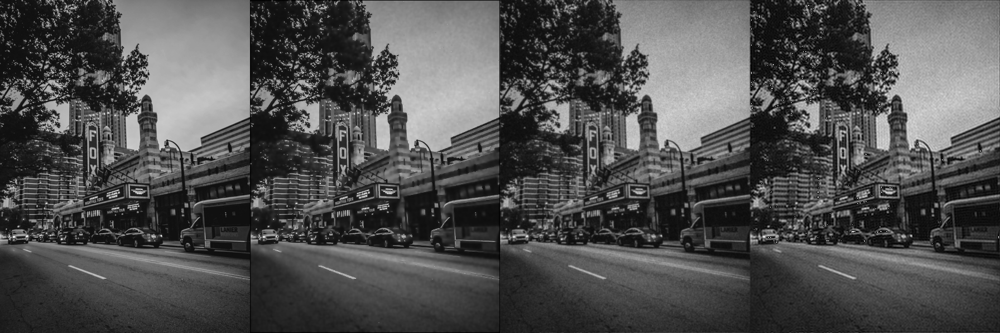

In [244]:
print('PSNR for poisson noise denoised with anisotorpic diffusion: ', psnr(orig, denoised_p))
print('PSNR for poisson noise denoised with gaussian blur: ', psnr(orig, gbp))
print('PSNR for poisson noise denoised with FFT: ', psnr(orig, fftp))

print('MSE for poisson noise denoised with anisotorpic diffusion: ', mse(orig, denoised_p))
print('MSE for poisson noise denoised with gaussian blur: ', mse(orig, gbp))
print('MSE for poisson noise denoised with FFT: ', mse(orig, fftp))

Image.fromarray(np.hstack((np.uint8(orig*255),np.uint8(denoised_p*255), np.uint8(gbp*255), np.uint8(fftp*255))))

PSNR for gaussian blur noise denoised with anisotorpic diffusion:  72.99981011063329
PSNR for gaussian blur noise denoised with gaussian blur:  73.77525200641574
PSNR for gaussian blur noise denoised with FFT:  71.98445763214467
MSE for gaussian blur noise denoised with anisotorpic diffusion:  0.0032591124838152147
MSE for gaussian blur noise denoised with gaussian blur:  0.00272618397260605
MSE for gaussian blur noise denoised with FFT:  0.004117509384310155


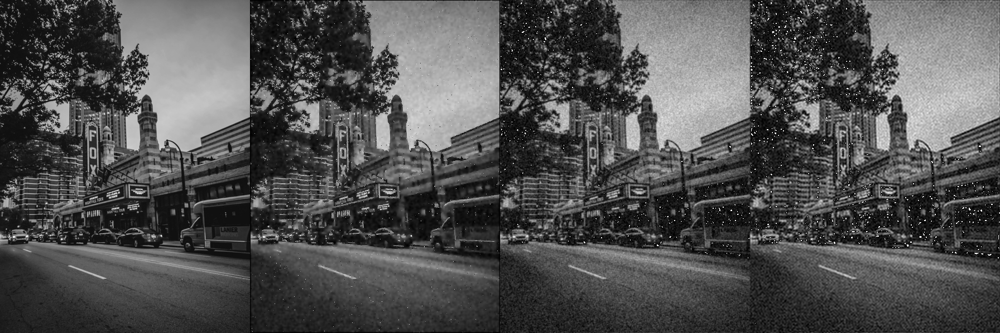

In [245]:
print('PSNR for gaussian blur noise denoised with anisotorpic diffusion: ', psnr(orig, denoised_g))
print('PSNR for gaussian blur noise denoised with gaussian blur: ', psnr(orig, gbg))
print('PSNR for gaussian blur noise denoised with FFT: ', psnr(orig, fftg))

print('MSE for gaussian blur noise denoised with anisotorpic diffusion: ', mse(orig, denoised_g))
print('MSE for gaussian blur noise denoised with gaussian blur: ', mse(orig, gbg))
print('MSE for gaussian blur noise denoised with FFT: ', mse(orig, fftg))

Image.fromarray(np.hstack((np.uint8(orig*255),np.uint8(denoised_g*255), np.uint8(gbg*255), np.uint8(fftg*255))))

PSNR for sp noise denoised with anisotorpic diffusion:  71.65728349319879
PSNR for sp noise denoised with gaussian blur:  76.31667378287062
PSNR for sp noise denoised with FFT:  73.73427876584786
MSE for sp noise denoised with anisotorpic diffusion:  0.00443968350706206
MSE for sp noise denoised with gaussian blur:  0.0015184936585485728
MSE for sp noise denoised with FFT:  0.002752025693719436


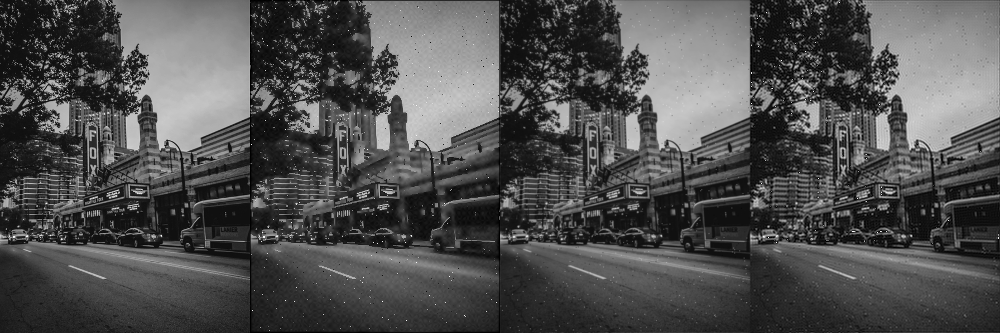

In [246]:
print('PSNR for sp noise denoised with anisotorpic diffusion: ', psnr(orig, denoised_sp))
print('PSNR for sp noise denoised with gaussian blur: ', psnr(orig, gbsp))
print('PSNR for sp noise denoised with FFT: ', psnr(orig, fftsp))

print('MSE for sp noise denoised with anisotorpic diffusion: ', mse(orig, denoised_sp))
print('MSE for sp noise denoised with gaussian blur: ', mse(orig, gbsp))
print('MSE for sp noise denoised with FFT: ', mse(orig, fftsp))

Image.fromarray(np.hstack((np.uint8(orig*255),np.uint8(denoised_sp*255), np.uint8(gbsp*255), np.uint8(fftsp*255))))

PSNR for speckle noise denoised with anisotorpic diffusion:  58.02449991770855
PSNR for speckle noise denoised with gaussian blur:  64.70614513494353
PSNR for speckle noise denoised with FFT:  63.99200580485581
MSE for speckle noise denoised with anisotorpic diffusion:  0.10247793584972242
MSE for speckle noise denoised with gaussian blur:  0.02200218679114432
MSE for speckle noise denoised with FFT:  0.025934613514081148


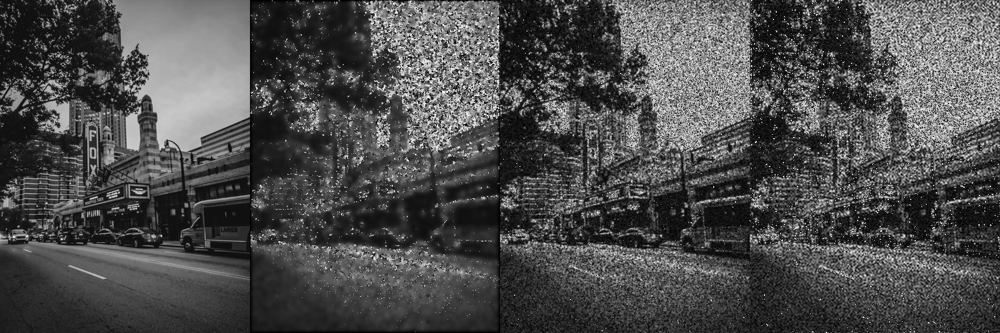

In [247]:
print('PSNR for speckle noise denoised with anisotorpic diffusion: ', psnr(orig, denoised_speckle))
print('PSNR for speckle noise denoised with gaussian blur: ', psnr(orig, gbspeckle))
print('PSNR for speckle noise denoised with FFT: ', psnr(orig, fftspeckle))

print('MSE for speckle noise denoised with anisotorpic diffusion: ', mse(orig, denoised_speckle))
print('MSE for speckle noise denoised with gaussian blur: ', mse(orig, gbspeckle))
print('MSE for speckle noise denoised with FFT: ', mse(orig, fftspeckle))

Image.fromarray(np.hstack((np.uint8(orig*255),np.uint8(denoised_speckle*255), np.uint8(gbspeckle*255), np.uint8(fftspeckle*255))))